In [1]:
# --------------------------------------------------------
# Tensorflow Faster R-CNN
# Licensed under The MIT License [see LICENSE for details]
# Written by Jiasen Lu, Jianwei Yang, based on code from Ross Girshick
# --------------------------------------------------------
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
import warnings
warnings.filterwarnings("ignore")

import _init_paths
import os
import sys
import numpy as np
import argparse
import pprint
import pdb
import time
import cv2
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.optim as optim

import torchvision.transforms as transforms
import torchvision.datasets as dset
from scipy.misc import imread
from roi_data_layer.roidb import combined_roidb
from roi_data_layer.roibatchLoader import roibatchLoader
from model.utils.config import cfg, cfg_from_file, cfg_from_list, get_output_dir
from model.rpn.bbox_transform import clip_boxes
from model.nms.nms_wrapper import nms
from model.rpn.bbox_transform import bbox_transform_inv
from model.utils.net_utils import save_net, load_net, vis_detections
from model.utils.blob import im_list_to_blob
from model.faster_rcnn.vgg16 import vgg16
from model.faster_rcnn.resnet import resnet
import pdb
print('All loaded')


# XXX
import matplotlib.pyplot as plt
%matplotlib inline

tables_train ++++++++++++++++++++++++++++++++-------------------------- /home/raja/faster-rcnn.pytorch/data/TABLES
tables_test ++++++++++++++++++++++++++++++++-------------------------- /home/raja/faster-rcnn.pytorch/data/TABLES


ImportError: torch.utils.ffi requires the cffi package

In [2]:
# List of trained models

print(os.listdir('trained-models/res101/table/'))

['faster_rcnn_1_25_977.pth', 'faster_rcnn_1_18_977.pth', 'faster_rcnn_1_15_977.pth', 'faster_rcnn_1_14_977.pth', 'faster_rcnn_1_11_977.pth', 'faster_rcnn_1_23_977.pth', 'faster_rcnn_1_3_488.pth', 'faster_rcnn_1_4_977.pth', 'faster_rcnn_1_8_977.pth', 'faster_rcnn_1_6_977.pth', 'faster_rcnn_1_27_977.pth', 'faster_rcnn_1_19_977.pth', 'faster_rcnn_1_17_977.pth', 'faster_rcnn_1_26_977.pth', 'faster_rcnn_1_12_977.pth', 'faster_rcnn_1_2_977.pth', 'faster_rcnn_1_10_977.pth', 'faster_rcnn_1_28_977.pth', 'faster_rcnn_1_24_977.pth', 'faster_rcnn_1_29_977.pth', 'faster_rcnn_1_16_977.pth', 'faster_rcnn_1_9_977.pth', 'faster_rcnn_1_7_977.pth', 'faster_rcnn_1_1_977.pth', 'faster_rcnn_1_12_1955.pth', 'faster_rcnn_1_20_977.pth', 'faster_rcnn_1_5_977.pth', 'faster_rcnn_1_21_977.pth', 'faster_rcnn_1_13_977.pth', 'faster_rcnn_1_3_977.pth', 'faster_rcnn_1_22_977.pth']


#### Load model

In [166]:
def _get_image_blob(im):
    """Converts an image into a network input.
    Arguments:
    im (ndarray): a color image in BGR order
    Returns:
    blob (ndarray): a data blob holding an image pyramid
    im_scale_factors (list): list of image scales (relative to im) used
      in the image pyramid
    """
    im_orig = im.astype(np.float32, copy=True)
#     im_orig -= cfg.PIXEL_MEANS
#     im_orig -=np.array([[[0,0,0]]])
    im_shape = im_orig.shape
    im_size_min = np.min(im_shape[0:2])
    im_size_max = np.max(im_shape[0:2])
    
    processed_ims = []
    im_scale_factors = []
    
    for target_size in cfg.TEST.SCALES:
        im_scale = float(target_size) / float(im_size_min)
        # Prevent the biggest axis from being more than MAX_SIZE
        if np.round(im_scale * im_size_max) > cfg.TEST.MAX_SIZE:
            im_scale = float(cfg.TEST.MAX_SIZE) / float(im_size_max)
        
        im = cv2.resize(im_orig,None,fx=im_scale, fy=im_scale,
                interpolation=cv2.INTER_LINEAR)
        im_scale_factors.append(im_scale)
        processed_ims.append(im)

    # Create a blob to hold the input images
    blob = im_list_to_blob(processed_ims)

    return blob, np.array(im_scale_factors)
def load_model(s,ep,x,path='trained-models/res101/table/',net='res101'):
    # What type of model to load? Initializing object of the model.
    # Model path
    load_name = os.path.join(path,'faster_rcnn_{}_{}_{}.pth'.format(1, 12,1955))
    

    # initilize the network here.
    if net == 'vgg16':
        fasterRCNN = vgg16(classes, pretrained=False, class_agnostic=args.class_agnostic)
    elif net == 'res101':
        fasterRCNN = resnet(classes, 101, pretrained=False, class_agnostic=False)
    elif net == 'res50':
        fasterRCNN = resnet(classes, 50, pretrained=False, class_agnostic=args.class_agnostic)
    elif net == 'res152':
        fasterRCNN = resnet(classes, 152, pretrained=False, class_agnostic=args.class_agnostic)
    # Creating Architecture
    fasterRCNN.create_architecture()
    # Loading the model
    # checkpoint = torch.load(load_name)
    checkpoint = torch.load(load_name, map_location=(lambda storage, loc: storage))
    fasterRCNN.load_state_dict(checkpoint['model'])
    if 'pooling_mode' in checkpoint.keys():
        cfg.POOLING_MODE = checkpoint['pooling_mode']
    return fasterRCNN


def data_init(C=1):
    # initilize the tensor holder here.
    im_data = torch.FloatTensor(1)
    im_info = torch.FloatTensor(1)
    num_boxes = torch.LongTensor(1)
    gt_boxes = torch.FloatTensor(1)

    # ship to cuda
    if C > 0:
        im_data = im_data.cuda()
        im_info = im_info.cuda()
        num_boxes = num_boxes.cuda()
        gt_boxes = gt_boxes.cuda()

    # make variable
    im_data = Variable(im_data, volatile=True)
    im_info = Variable(im_info, volatile=True)
    num_boxes = Variable(num_boxes, volatile=True)
    gt_boxes = Variable(gt_boxes, volatile=True)
    return im_data,im_info,num_boxes,gt_boxes


def forward(im_in,model,img2,thresh=0.6,NMS=0.3):
    # Initializing initial tensors
    im_data,im_info,num_boxes,gt_boxes = data_init(C=1)
    
    if len(im_in.shape) == 2:
        im_in = im_in[:,:,np.newaxis]
        im_in = np.concatenate((im_in,im_in,im_in), axis=2)

    # rgb -> bgr
    
    im = im_in[:,:,::-1]
    
    
    
    blobs, im_scales = _get_image_blob(im)
   
    im_blob = blobs
    im_info_np = np.array([[im_blob.shape[1], im_blob.shape[2], im_scales[0]]], dtype=np.float32)

    im_data_pt = torch.from_numpy(im_blob)
    im_data_pt = im_data_pt.permute(0, 3, 1, 2)
    im_info_pt = torch.from_numpy(im_info_np)

    im_data.data.resize_(im_data_pt.size()).copy_(im_data_pt)
    im_info.data.resize_(im_info_pt.size()).copy_(im_info_pt)
    gt_boxes.data.resize_(1, 1, 5).zero_()
    num_boxes.data.resize_(1).zero_()

    # Forward pass
    rois, cls_prob, bbox_pred, \
    rpn_loss_cls, rpn_loss_box, \
    RCNN_loss_cls, RCNN_loss_bbox, \
    rois_label = model(im_data, im_info, gt_boxes, num_boxes)

    # Predictions
    scores = cls_prob.data
    boxes = rois.data[:, :, 1:5]

    if cfg.TEST.BBOX_REG:
        box_deltas = bbox_pred.data
        if cfg.TRAIN.BBOX_NORMALIZE_TARGETS_PRECOMPUTED:
            box_deltas = box_deltas.view(-1, 4) * torch.FloatTensor(cfg.TRAIN.BBOX_NORMALIZE_STDS).cuda() \
                                   + torch.FloatTensor(cfg.TRAIN.BBOX_NORMALIZE_MEANS).cuda()
        box_deltas = box_deltas.view(1, -1, 4 * len(classes))
        pred_boxes = bbox_transform_inv(boxes, box_deltas, 1)
        pred_boxes = clip_boxes(pred_boxes, im_info.data, 1)
    else:
        pred_boxes = np.tile(boxes, (1, scores.shape[1]))
        
    pred_boxes /= im_scales[0]
    scores = scores.squeeze()
    pred_boxes = pred_boxes.squeeze()
    
    
    im2show = np.copy(img2)
    
    # Iterating over all classes
    
    for j in range(1, len(classes)):

        inds = torch.nonzero(scores[:,j]>thresh).view(-1)
        
        # if there is det
        if inds.numel() > 0:
            cls_scores = scores[:,j][inds]
            _, order = torch.sort(cls_scores, 0, True)

            cls_boxes = pred_boxes[inds][:, j * 4:(j + 1) * 4]
            
            cls_dets = torch.cat((cls_boxes, cls_scores.unsqueeze(1)), 1)
            # cls_dets = torch.cat((cls_boxes, cls_scores), 1)
            cls_dets = cls_dets[order]
            keep = nms(cls_dets,NMS, force_cpu=not cfg.USE_GPU_NMS)
            cls_dets = cls_dets[keep.view(-1).long()]

            im2show = vis_detections(im2show, classes[j], cls_dets.cpu().numpy(), 0.5)
        else:
            cls_dets=[[0]]
            im2show=img2
            return im2show,cls_dets
    return im2show,cls_dets.cpu().numpy()
    

In [223]:
# Configuration specific initializations
classes = np.asarray(['__background__','table'])
cfg.USE_GPU_NMS = True
torch.device = 'cuda'
max_per_image = 100
thresh = 0.99
# setting NMS threshold
NMS = 0.3

# Loading the model weights
model = load_model(1,3,977)
# Cuda enabled
model.cuda()
# Enabiling evaluation mode
model.eval()

RLH-2.jpg
Confidence: 99.95486450195312 & Image: RLH-2.jpg


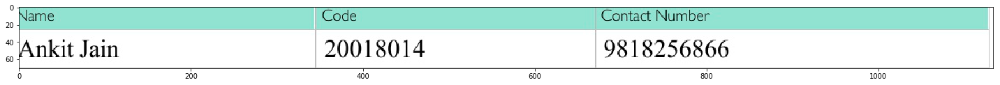

Confidence: 99.91624450683594 & Image: RLH-2.jpg


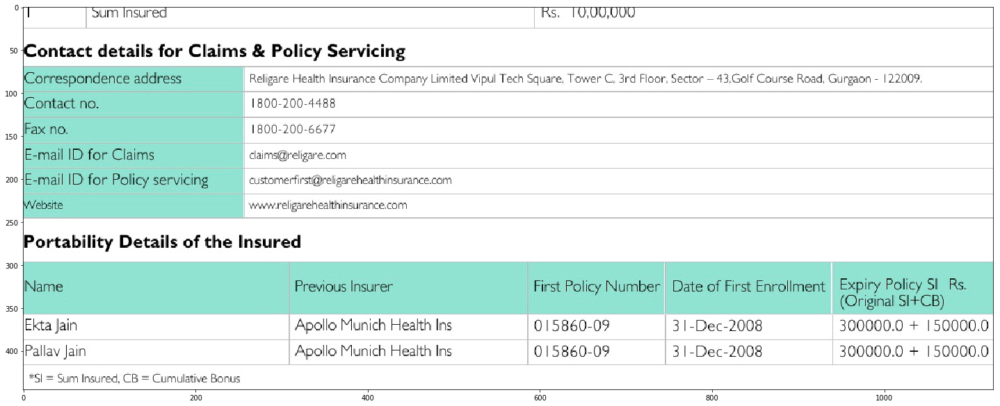

Confidence: 99.82030487060547 & Image: RLH-2.jpg


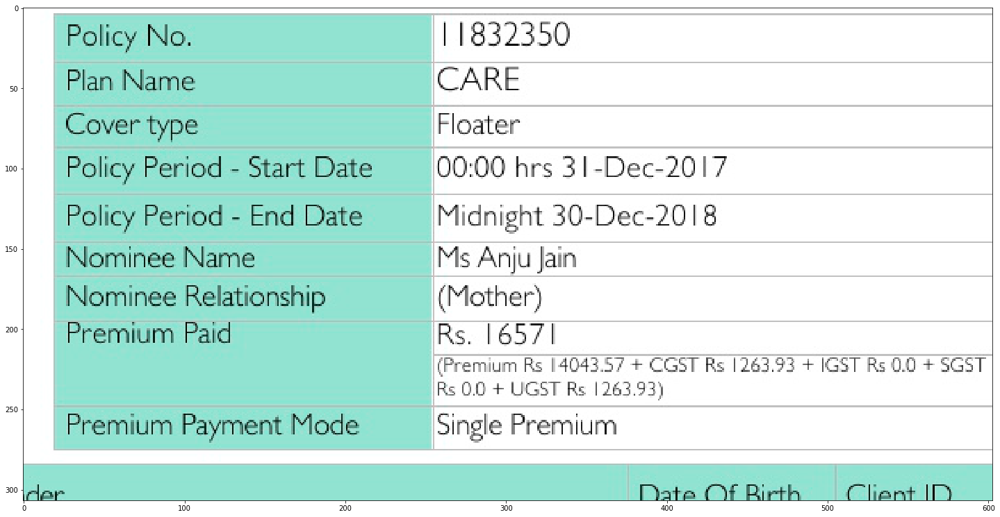

Confidence: 99.73759460449219 & Image: RLH-2.jpg


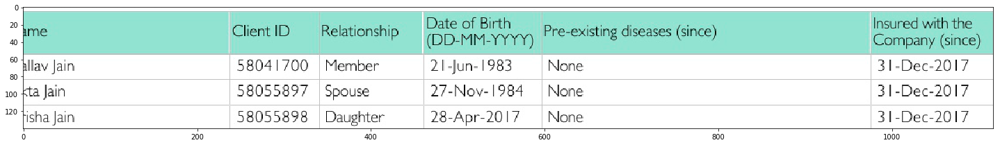

BJAN-1.jpg
Confidence: 99.95208740234375 & Image: BJAN-1.jpg


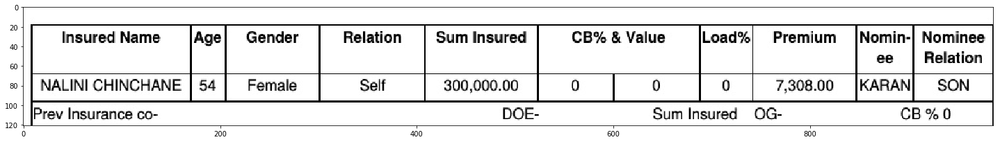

TATAAIGSB-1.jpg
Confidence: 99.95552062988281 & Image: TATAAIGSB-1.jpg


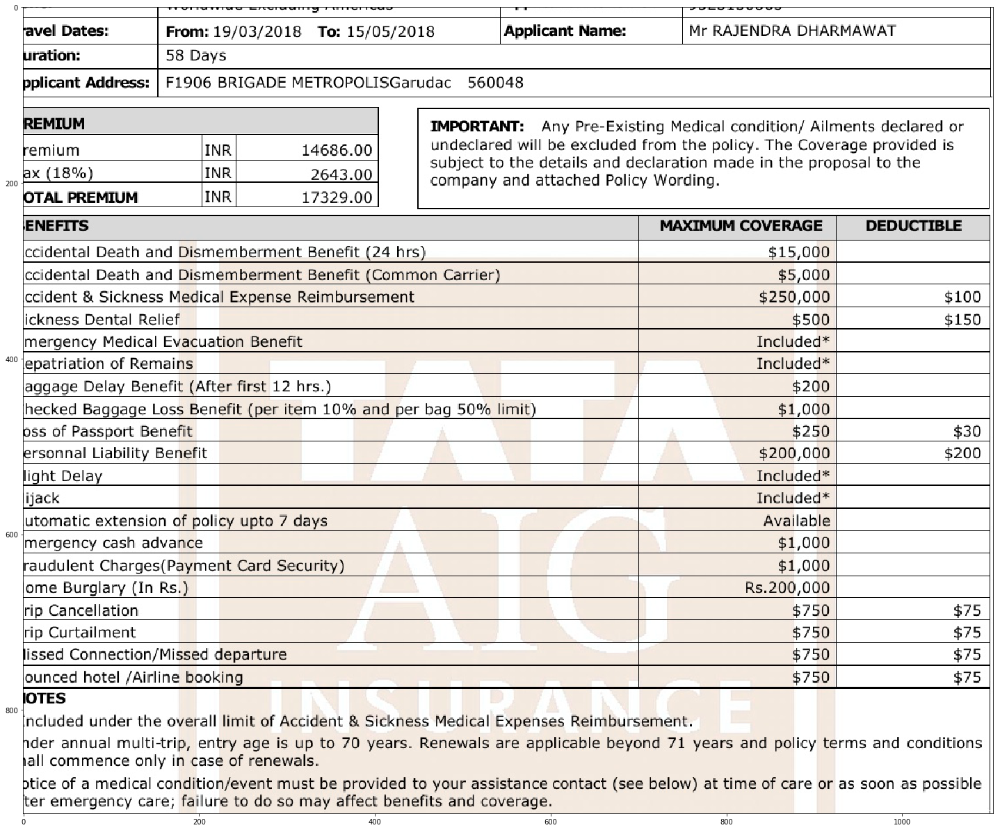

Confidence: 99.19644927978516 & Image: TATAAIGSB-1.jpg


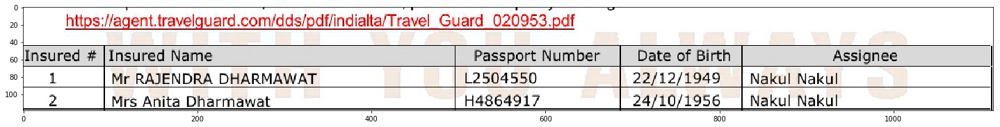

AHMI-3.jpg
Confidence: 99.99970245361328 & Image: AHMI-3.jpg


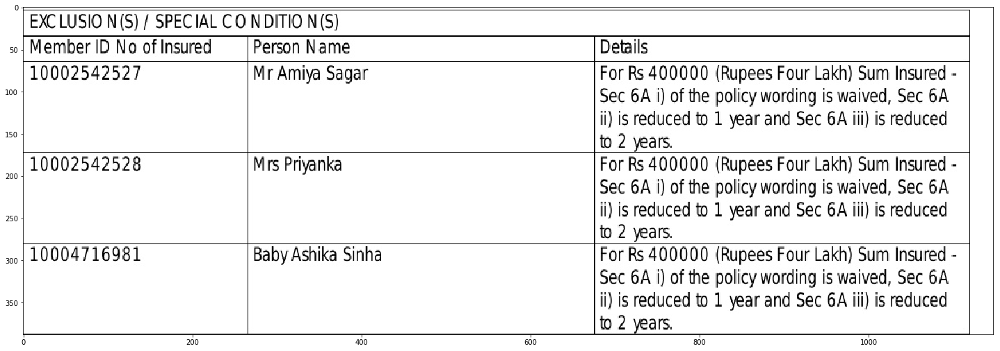

HDFCERTR-1.jpg
Confidence: 99.98819732666016 & Image: HDFCERTR-1.jpg


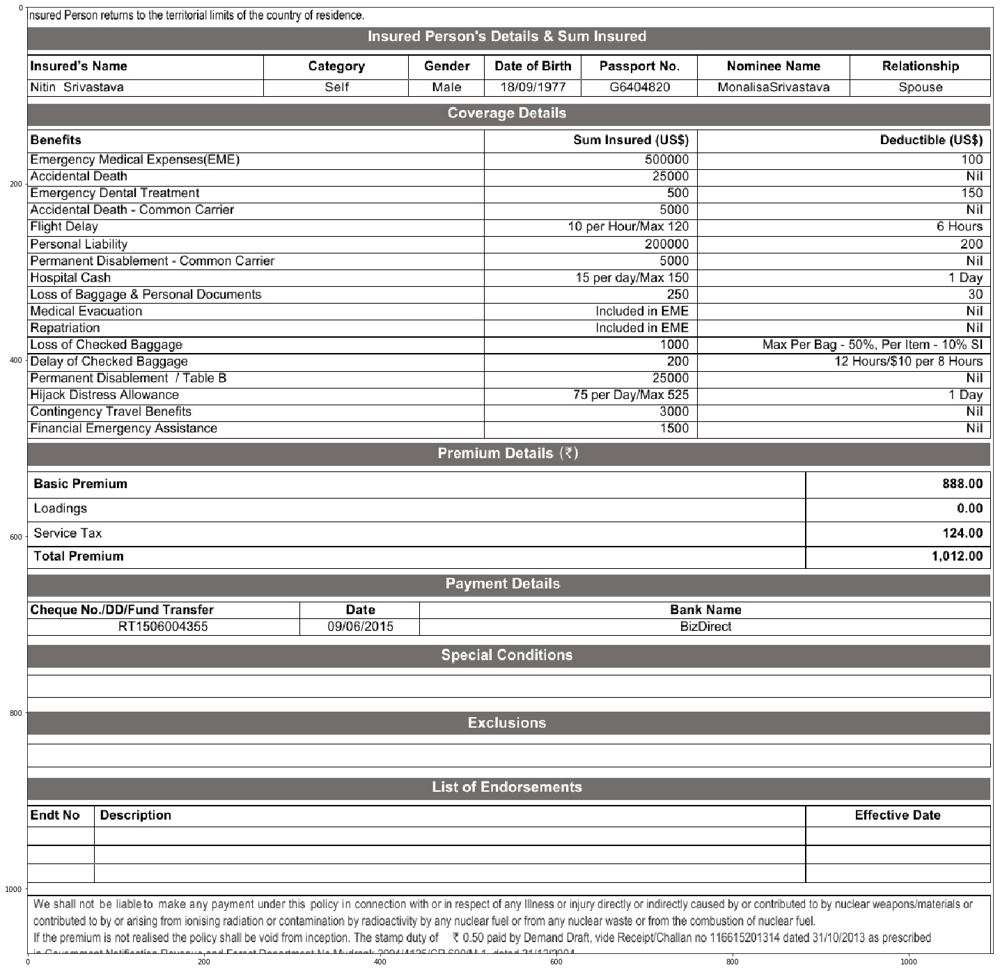

Confidence: 99.14228057861328 & Image: HDFCERTR-1.jpg


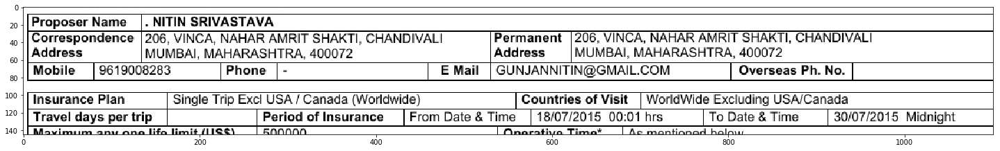

AHMI-5-2.jpg
Confidence: 99.98014831542969 & Image: AHMI-5-2.jpg


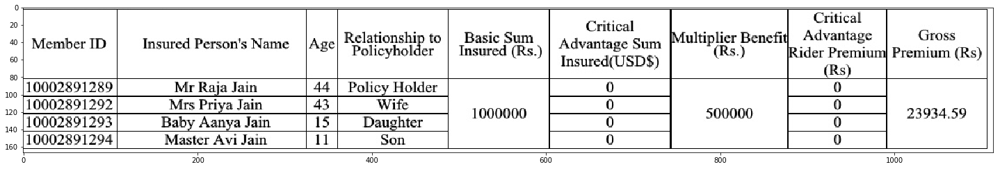

AHMI-3-2.jpg
Confidence: 99.9695053100586 & Image: AHMI-3-2.jpg


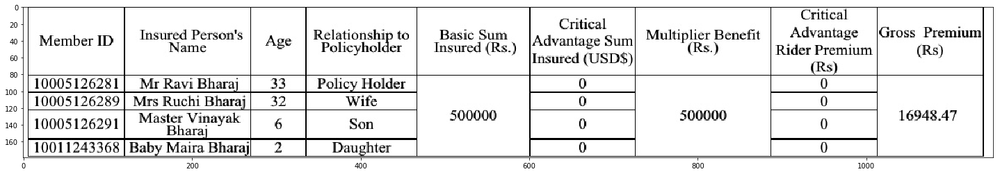

Confidence: 99.9423599243164 & Image: AHMI-3-2.jpg


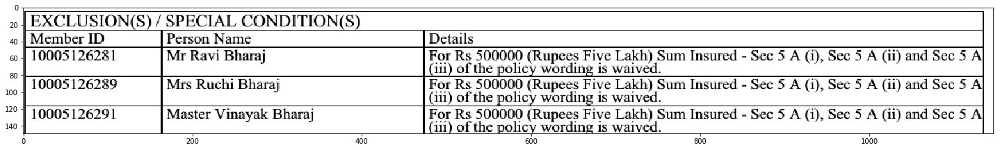

Confidence: 99.33421325683594 & Image: AHMI-3-2.jpg


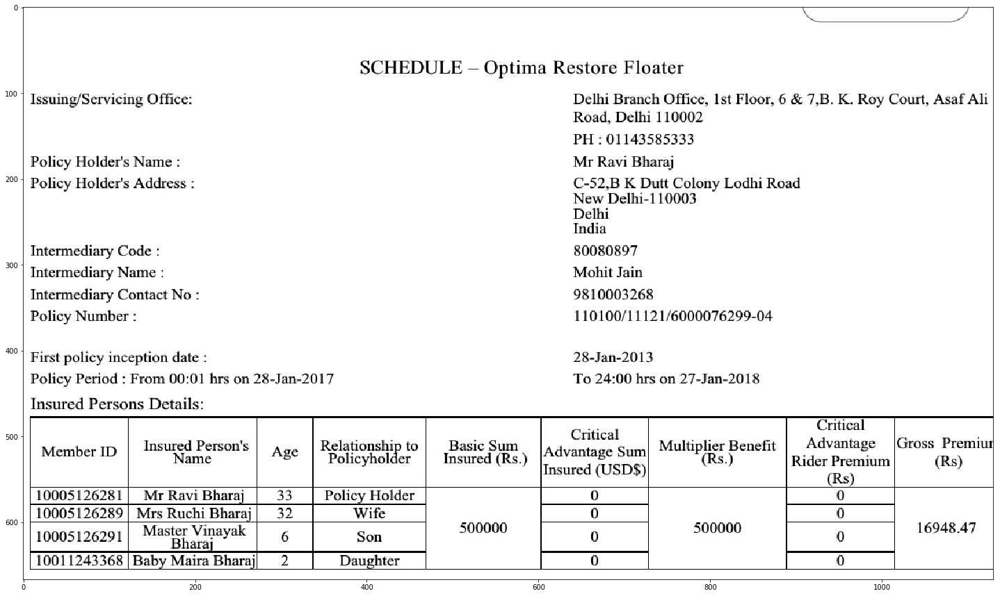

TATAAIG-TRAVEL-1.jpg
Confidence: 99.95991516113281 & Image: TATAAIG-TRAVEL-1.jpg


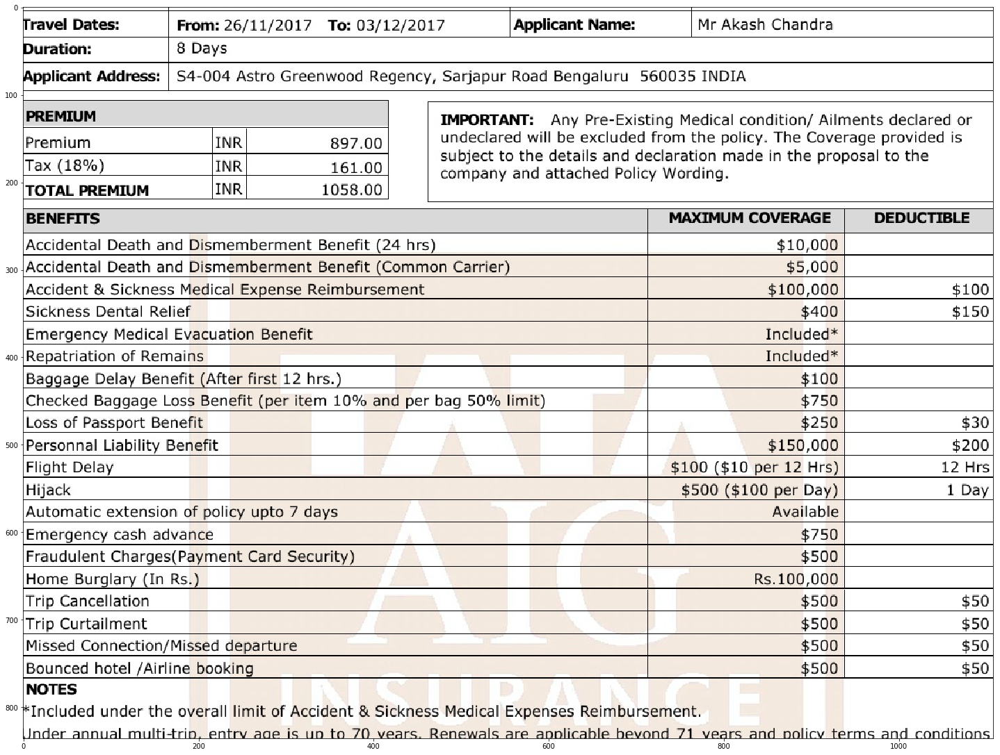

Confidence: 99.15574645996094 & Image: TATAAIG-TRAVEL-1.jpg


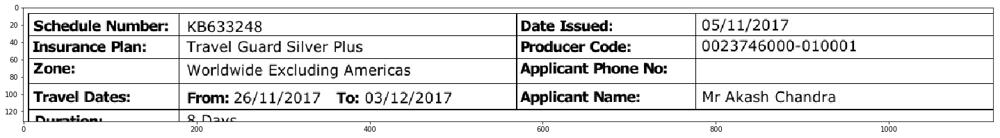

Confidence: 99.07524871826172 & Image: TATAAIG-TRAVEL-1.jpg


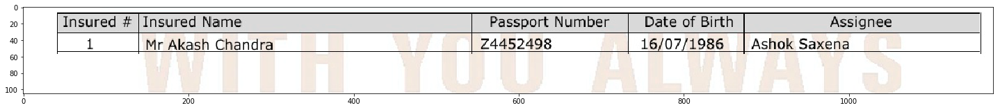

HDFCERH-1.jpg
Confidence: 99.99616241455078 & Image: HDFCERH-1.jpg


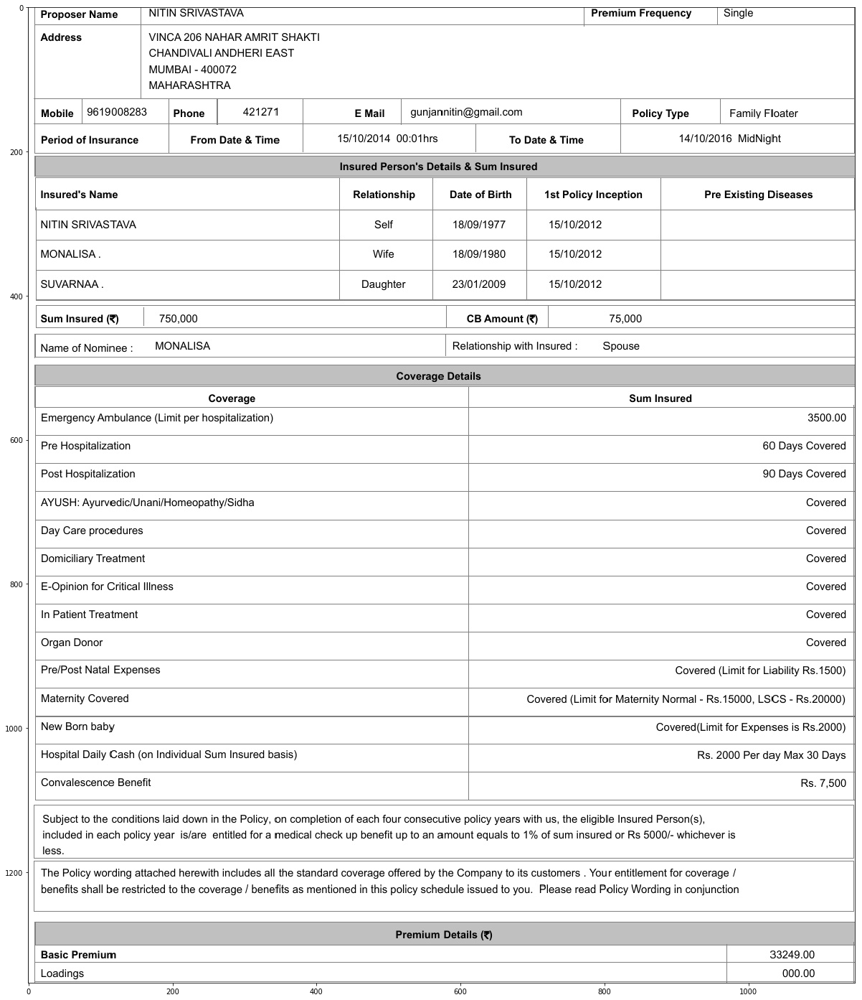

AHMI-8-3.jpg
AHMI-4-2.jpg
Confidence: 99.96638488769531 & Image: AHMI-4-2.jpg


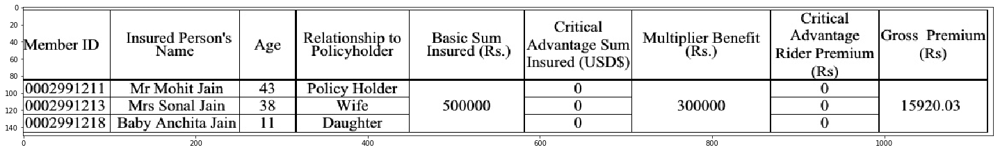

Confidence: 99.76017761230469 & Image: AHMI-4-2.jpg


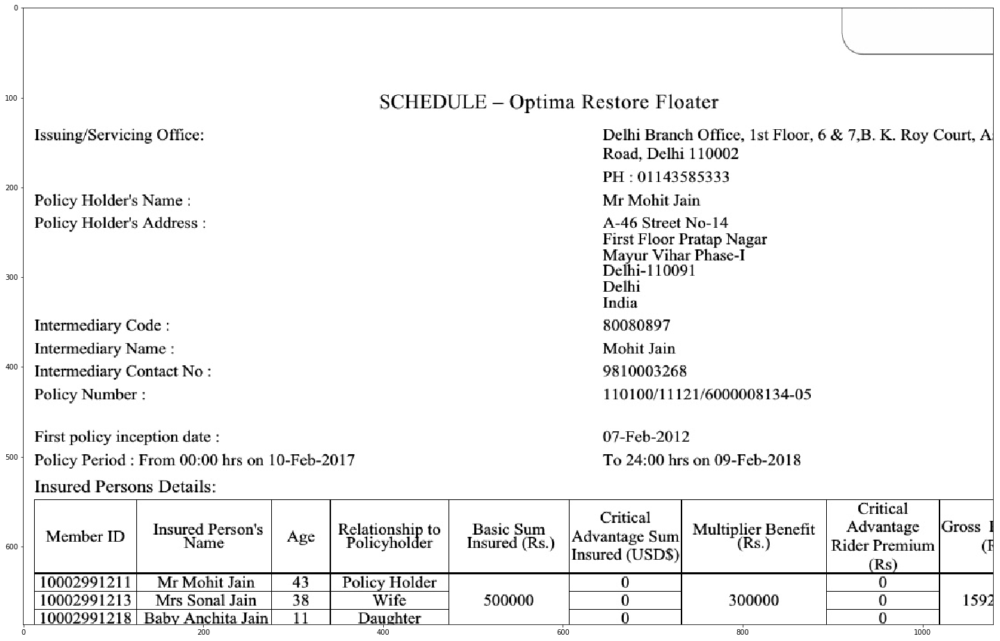

HDFCHI-1.jpg
Confidence: 99.95709991455078 & Image: HDFCHI-1.jpg


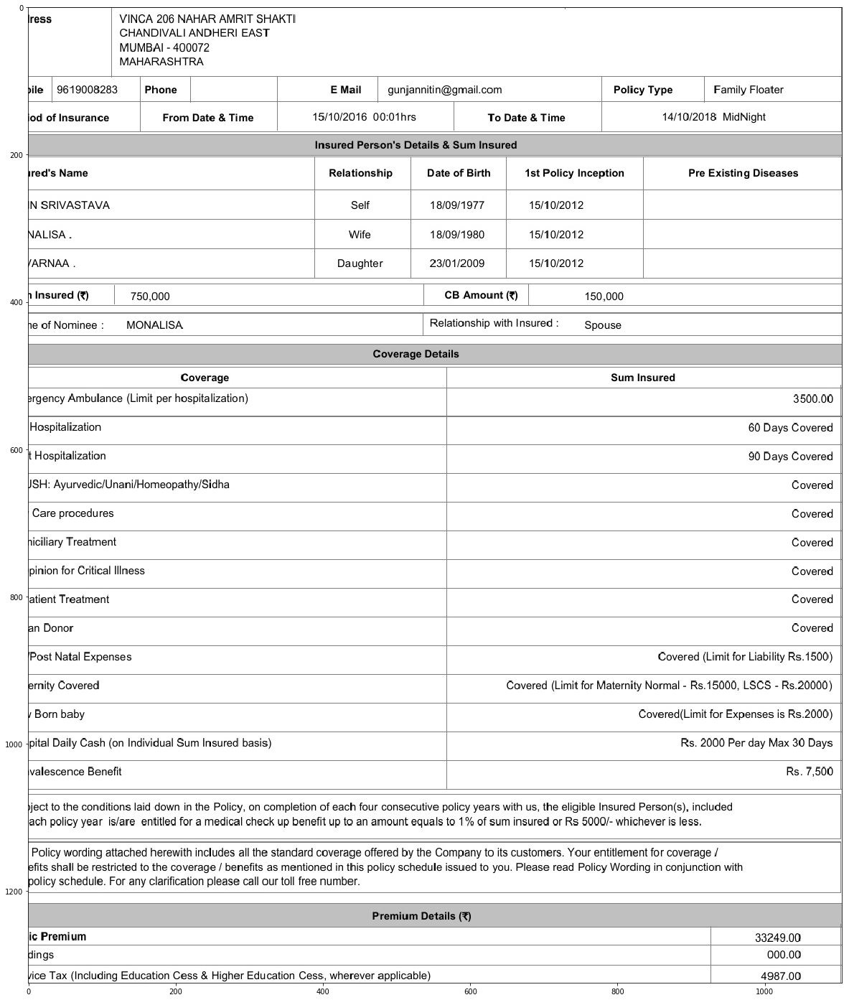

AHMIP-02.jpg
Confidence: 99.99603271484375 & Image: AHMIP-02.jpg


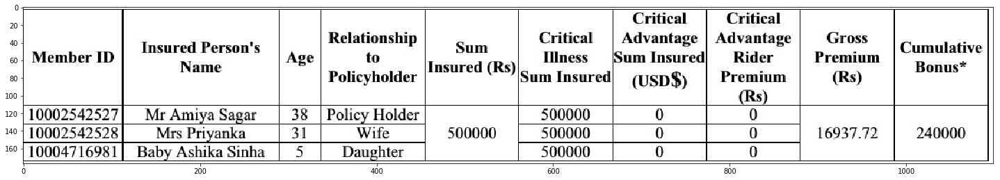

Confidence: 99.99046325683594 & Image: AHMIP-02.jpg


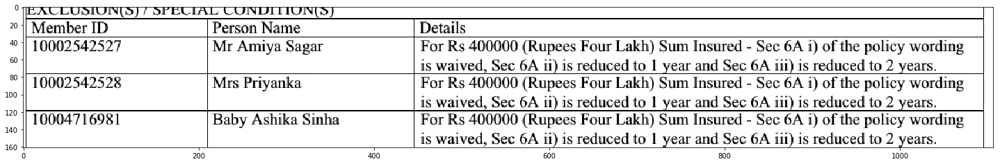

MAXBHUPAI-04.jpg
Confidence: 99.9994125366211 & Image: MAXBHUPAI-04.jpg


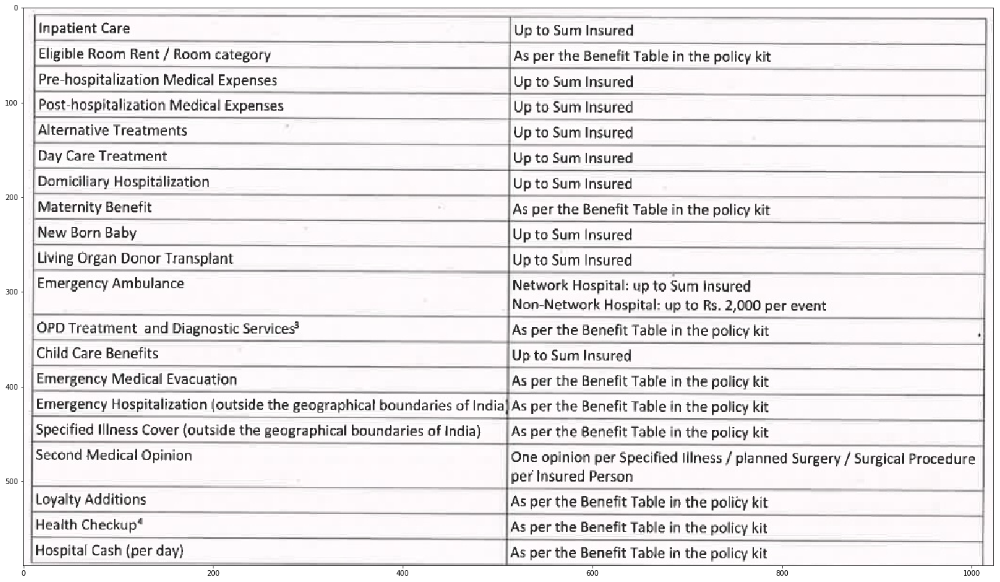

Confidence: 99.99556732177734 & Image: MAXBHUPAI-04.jpg


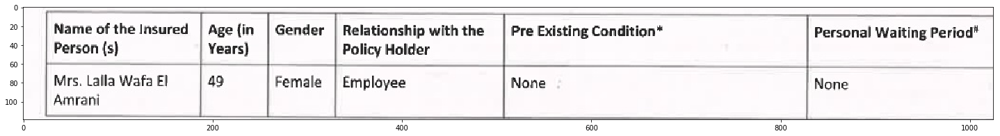

AHMI-6-2.jpg
Confidence: 99.99393463134766 & Image: AHMI-6-2.jpg


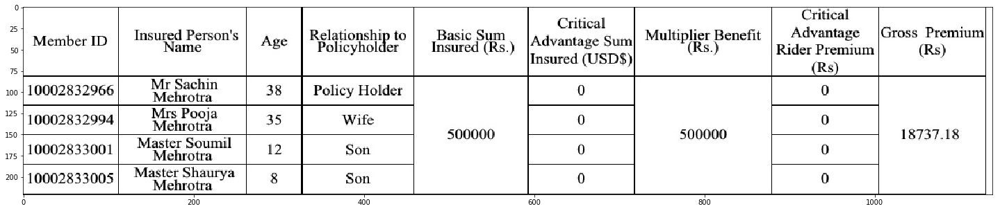

Confidence: 99.75119018554688 & Image: AHMI-6-2.jpg


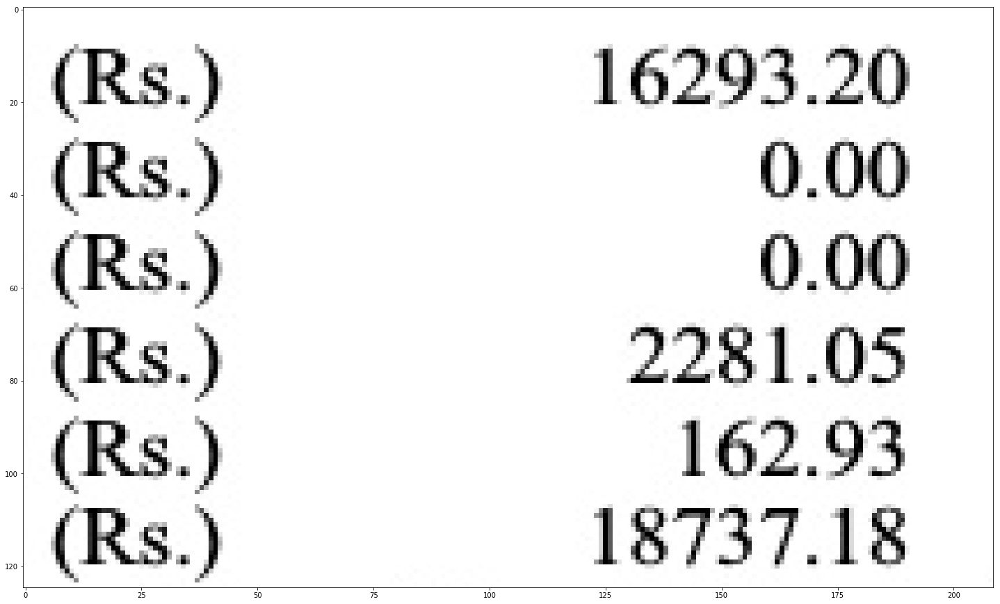

AHMI-6-3.jpg
Confidence: 99.99849700927734 & Image: AHMI-6-3.jpg


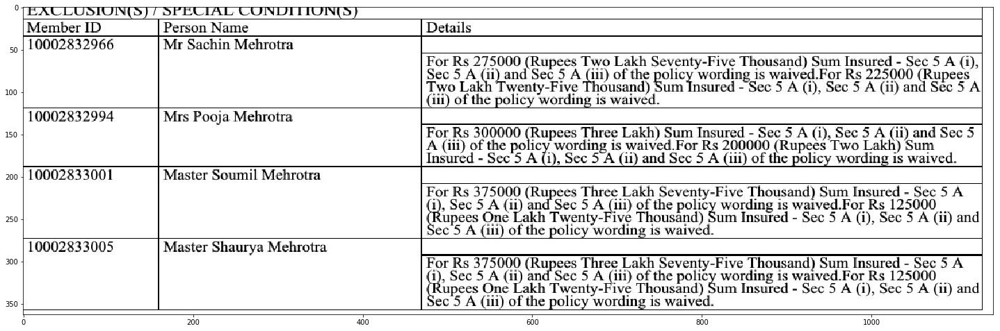

1534593902.jpg
Confidence: 99.96035766601562 & Image: 1534593902.jpg


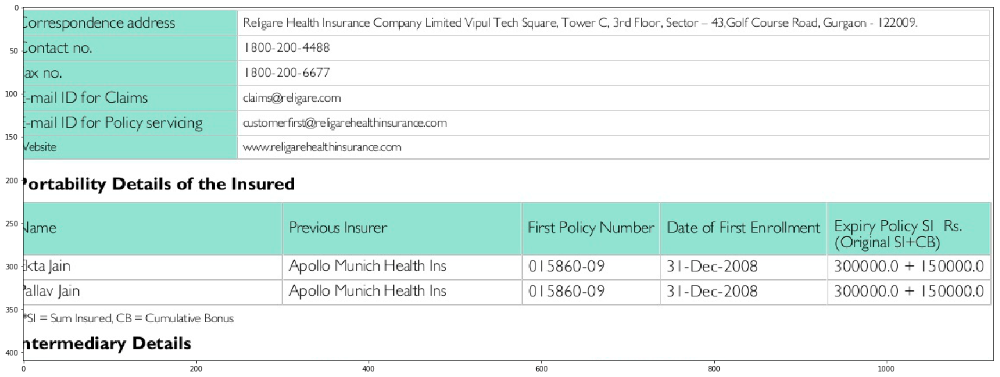

Confidence: 99.69650268554688 & Image: 1534593902.jpg


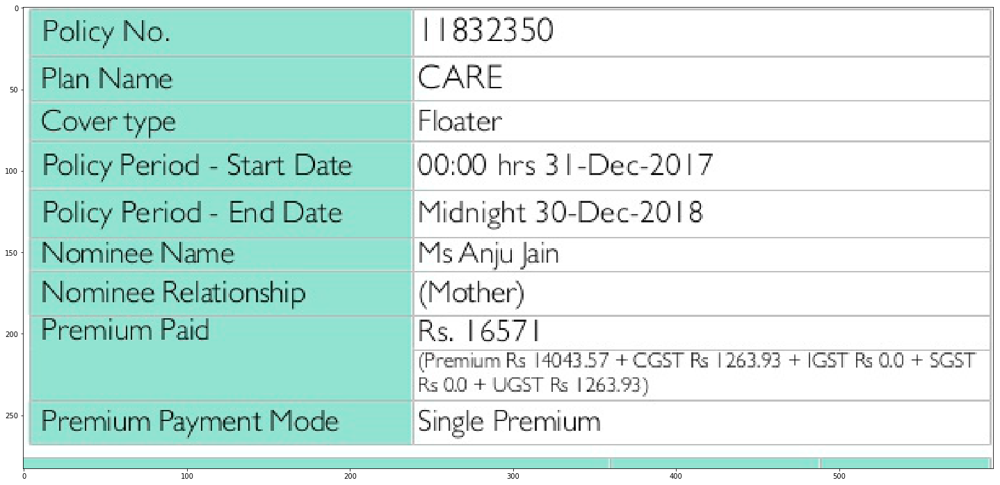

AHMI-2-2.jpg
Confidence: 99.99614715576172 & Image: AHMI-2-2.jpg


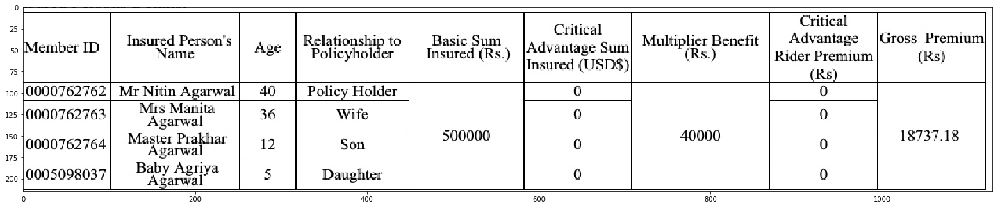

Confidence: 99.99124908447266 & Image: AHMI-2-2.jpg


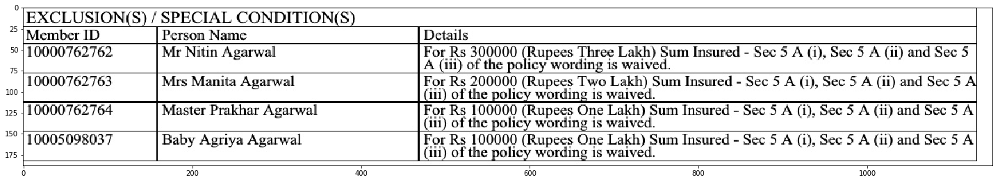

1534593902.7007136.jpg
Confidence: 99.83755493164062 & Image: 1534593902.7007136.jpg


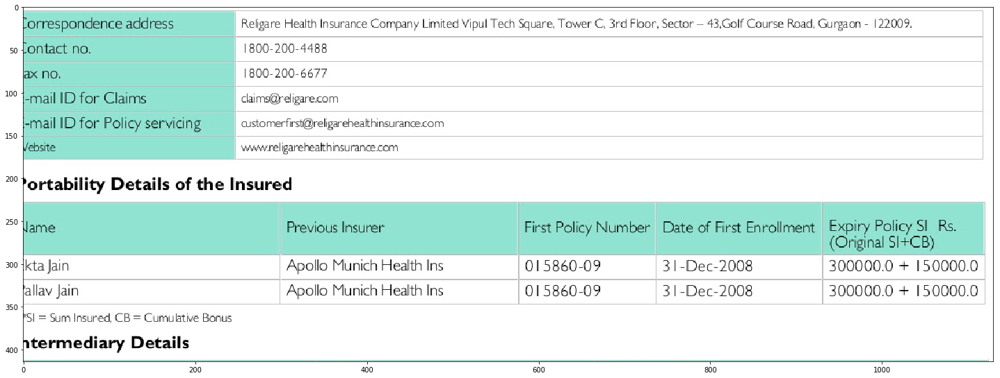

Confidence: 99.73889923095703 & Image: 1534593902.7007136.jpg


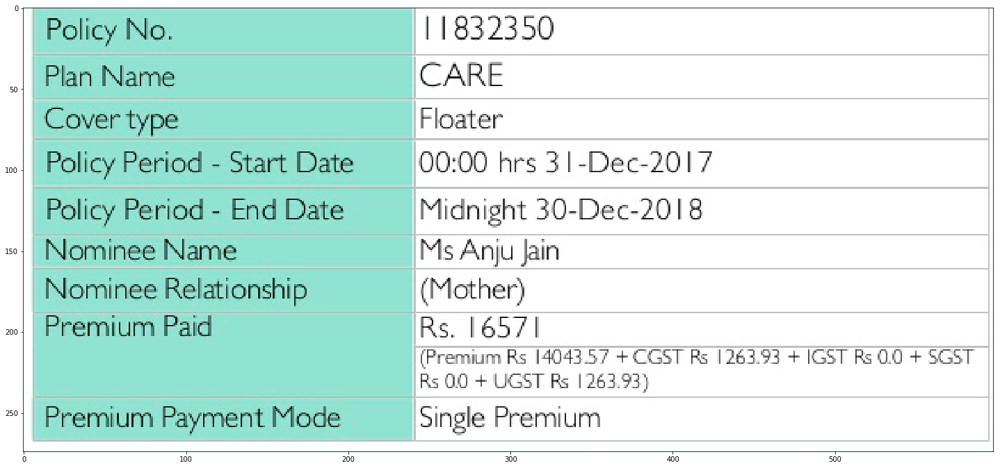

Confidence: 99.44740295410156 & Image: 1534593902.7007136.jpg


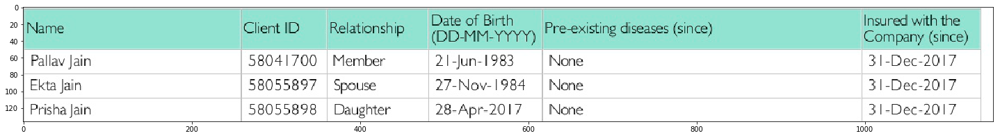

AHMI-5-3.jpg
Confidence: 99.98743438720703 & Image: AHMI-5-3.jpg


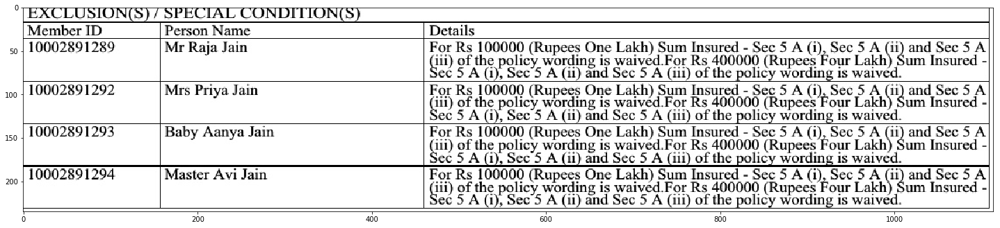

Confidence: 99.6046371459961 & Image: AHMI-5-3.jpg


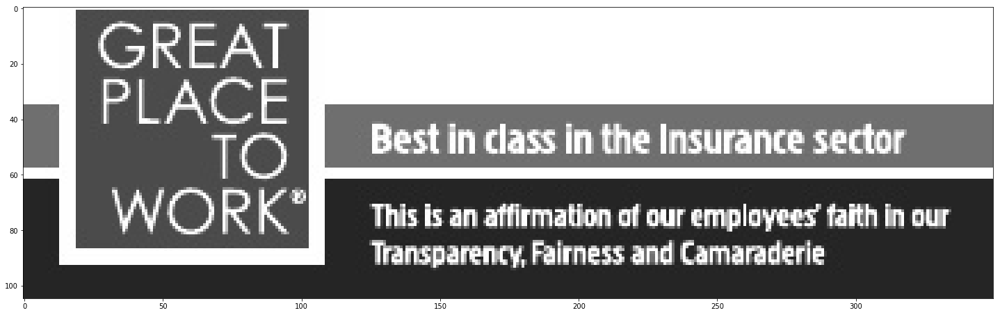

BJANi-1.jpg
Confidence: 99.99720764160156 & Image: BJANi-1.jpg


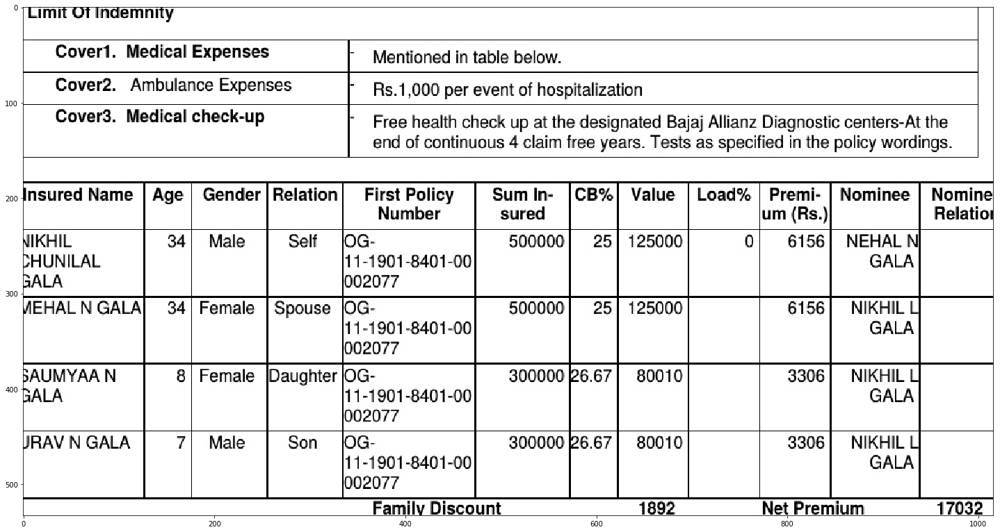

MAXBHUPAFP-04.jpg
Confidence: 99.99961853027344 & Image: MAXBHUPAFP-04.jpg


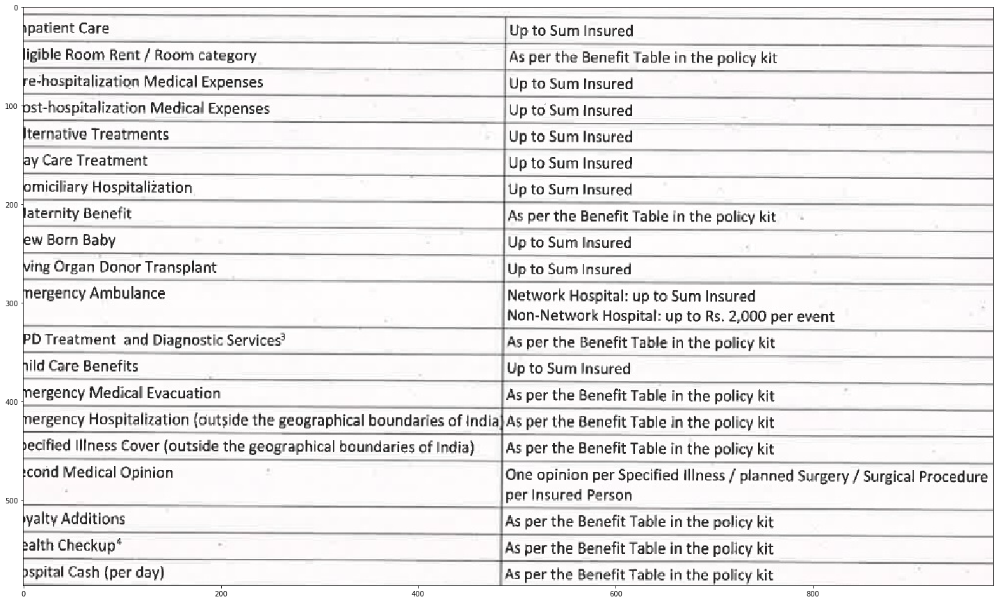

Confidence: 99.99838256835938 & Image: MAXBHUPAFP-04.jpg


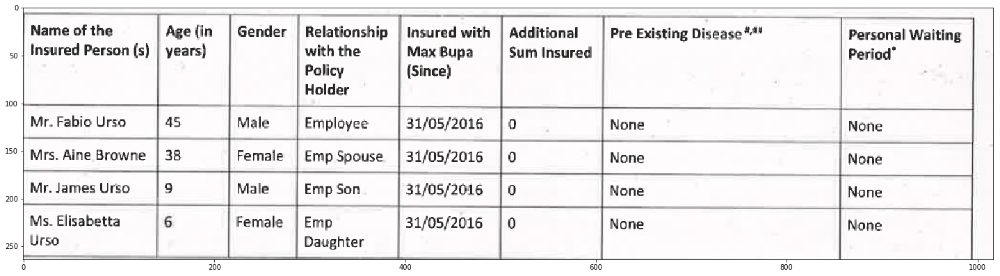

BJAM-1.jpg
Confidence: 99.99072265625 & Image: BJAM-1.jpg


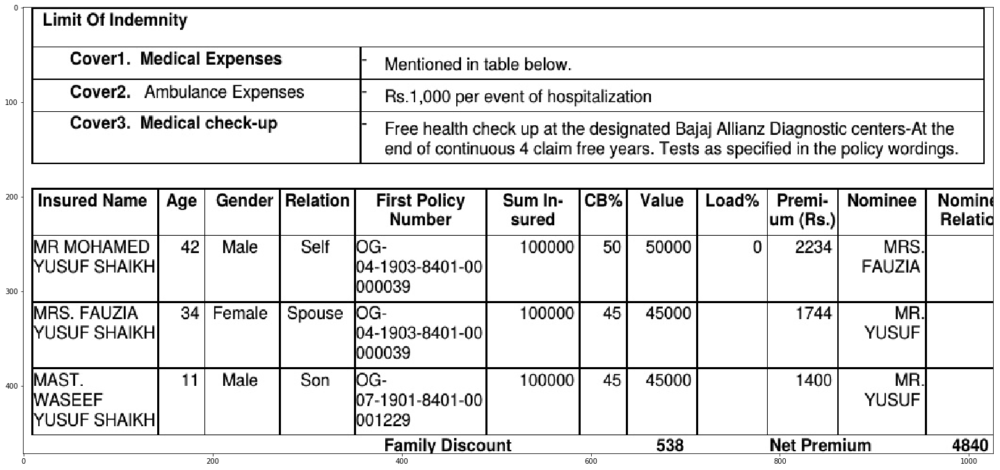

AHMI-7-2.jpg
Confidence: 99.99810791015625 & Image: AHMI-7-2.jpg


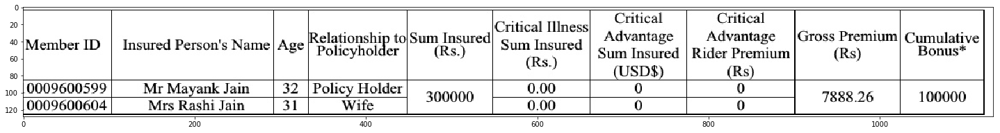

Confidence: 99.68829345703125 & Image: AHMI-7-2.jpg


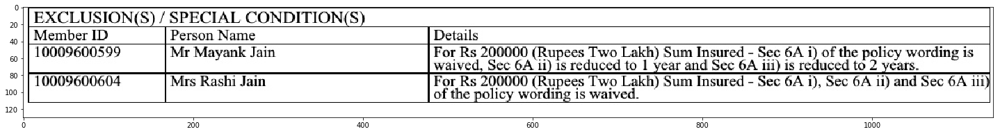

Confidence: 99.26154327392578 & Image: AHMI-7-2.jpg


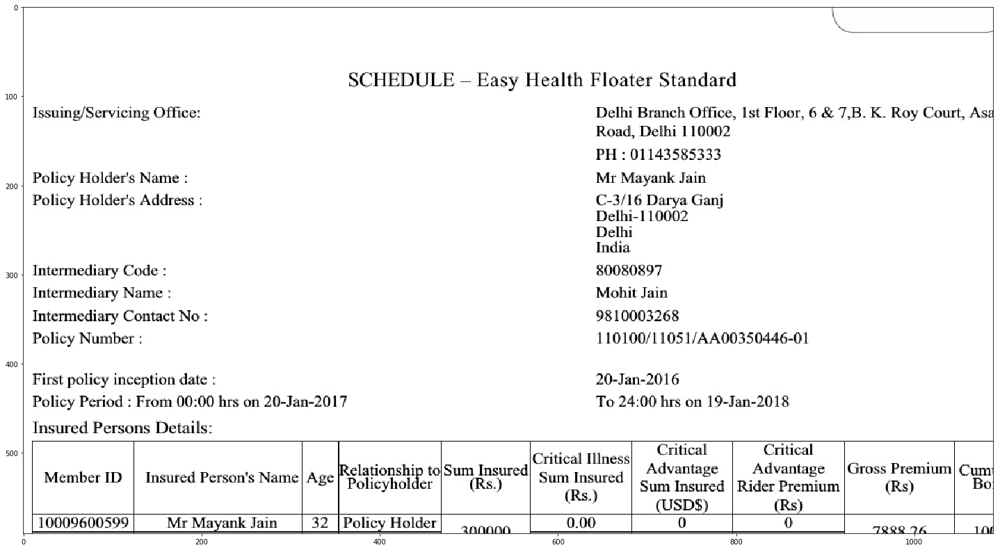

AHMI-2.jpg
Confidence: 99.99856567382812 & Image: AHMI-2.jpg


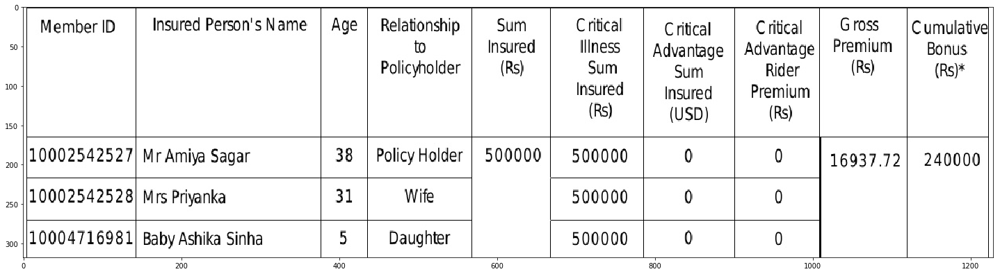

Confidence: 99.11605834960938 & Image: AHMI-2.jpg


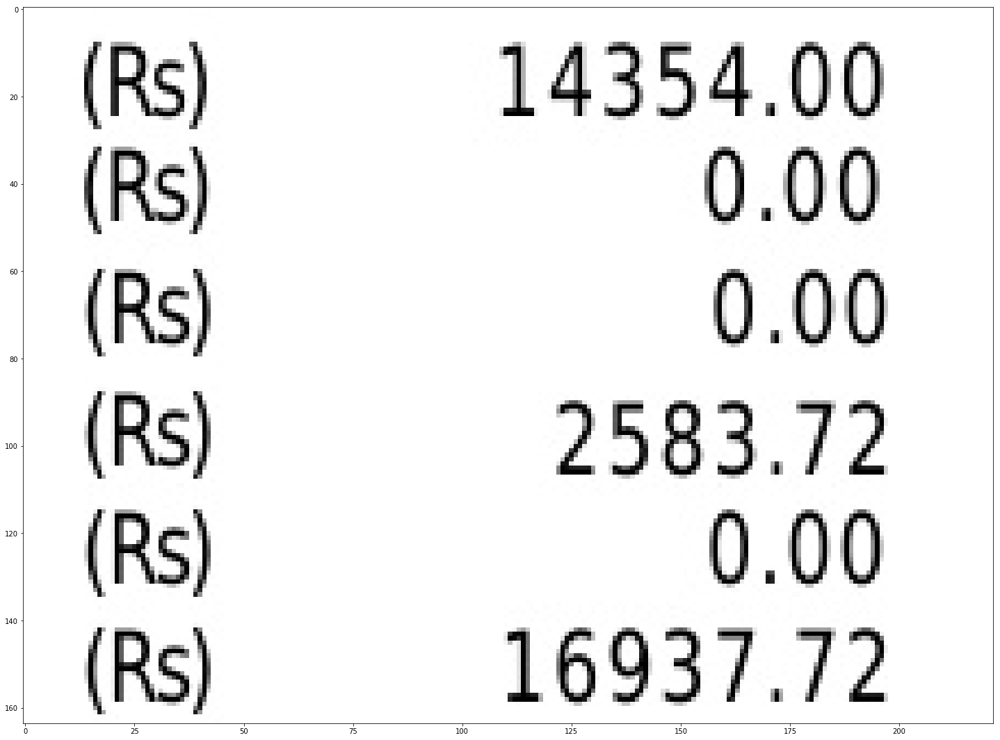

In [167]:
for k in os.listdir('table_img/'):
    print(k)
    # Loading the image for which boxes have to be calculated
    img = cv2.imread('table_img/'+k)
    img2=img.copy()
    im_in = cv2.Canny(img,50,100)

    
    # Forward pass through model calculating bounding boxes

    u,bo=forward(im_in,model,img2,thresh,NMS)
    if bo[0][0] !=0:
        confidence = bo[:,-1]*100
        detections = bo[:,:4]

        # Checking the predicted boxes
        for j,i in enumerate(detections):
            i=[int(x) for x in i]
            print('Confidence: {0} & Image: {1}'.format(confidence[j],k))
            plt.figure(figsize=(25,25))
            plt.imshow(img[i[1]:i[3],i[0]:i[2]])
            plt.show()

In [63]:
def plot(image):
    plt.figure(figsize=(25,25))
    plt.imshow(image)
    plt.show()

### Finding Precision & Recall

In [71]:
import pandas as pd

In [72]:
# Load the annotations; xmin,ymin,w,h format
df = pd.read_csv('truecover_tables.csv')

In [119]:
def bb_intersection_over_union(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    # return the intersection over union value
    return iou

In [263]:
def accuracy(path_images,model,df,iou_thresh = 0.6,thresh = 0.05,NMS = 0.3):
    tp =0 
    fp=0
    tp_fp=0
    for k in os.listdir(path_images):

        # Continue those which doesn't exist in the annotations
        if list(np.array(df[df['Image name'].apply(lambda x:x.split('.')[0])==k.split('.')[0]]['xmin']))==[]:

            continue

        # Extract the ground truth df of that specif image
        new_df = df[df['Image name'].apply(lambda x:x.split('.')[0])==k.split('.')[0]]

        # Loading the image for which boxes have to be calculated
        img = cv2.imread(path_images+k)
        img2=img.copy()
        im_in = cv2.Canny(img,50,100)

        # Forward pass through model calculating bounding boxes

        u,bo=forward(im_in,model,img2,thresh,NMS)


        if bo[0][0] !=0:
            tp_fp += bo.shape[0]
            confidence = bo[:,-1]*100
            detections = bo[:,:4]

            # Checking the predicted boxes
            gg = []
            for j,i in enumerate(detections):
                i=[int(x) for x in i]
                
                for t in new_df.iterrows():

                    xmin = t[1][1]
                    ymin = t[1][2]
                    xmax = xmin + t[1][3]
                    ymax = ymin + t[1][4]
                    ty = '{0},{1},{2},{3}'.format(xmin,ymin,xmax,ymax)
                    if bb_intersection_over_union([xmin,ymin,xmax,ymax],i)>iou_thresh:
                        # To not count those detections which are more than one for a single ground truth
                        if ty not in gg:
                            tp +=1
                            gg.append(ty)
                
    print('True Positive: {0}, Precision: {1}, Recall: {2}, Ground Truths: {3}'.format(tp,tp/tp_fp,tp/df.shape[0],df.shape[0]))

In [267]:
accuracy('table_img/',model,df)

True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46


#### For all models

In [270]:
list_models = os.listdir('trained-models/res101/table/')


for i in list_models:
    print('Model Name: ',i)
    s,ep,x=i.split('_')[2],i.split('_')[3],i.split('_')[3].split('.')[0]
    
    # Configuration specific initializations
    classes = np.asarray(['__background__','table'])
    cfg.USE_GPU_NMS = True
    torch.device = 'cuda'
    max_per_image = 100

    # Loading the model weights
    model = load_model(s,ep,x)
    # Cuda enabled
    model.cuda()
    # Enabiling evaluation mode
    model.eval()

    # Find accuracy
    accuracy('table_img/',model,df,iou_thresh = 0.6,thresh = 0.05,NMS = 0.3)
    

Model Name:  faster_rcnn_1_25_977.pth
True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46
Model Name:  faster_rcnn_1_18_977.pth
True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46
Model Name:  faster_rcnn_1_15_977.pth
True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46
Model Name:  faster_rcnn_1_14_977.pth
True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46
Model Name:  faster_rcnn_1_11_977.pth
True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46
Model Name:  faster_rcnn_1_23_977.pth
True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46
Model Name:  faster_rcnn_1_3_488.pth
True Positive: 32, Precision: 0.3368421052631579, Recall: 0.6956521739130435, Ground Truths: 46
Model Name:  faster_rcnn_1_4_977.pth
True Positive: 32, Precisi